In [1]:
# ДЗ
# 1. Реализуйте высокочастотную фильтрацию на основе ядра Гаусса
# 2. Реализуйте удаление периодического шума

In [2]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from skimage.feature import peak_local_max

# 1. Реализуйте высокочастотную фильтрацию на основе ядра Гаусса

In [3]:
img = cv.imread('periodic_noise.jpg', 0)

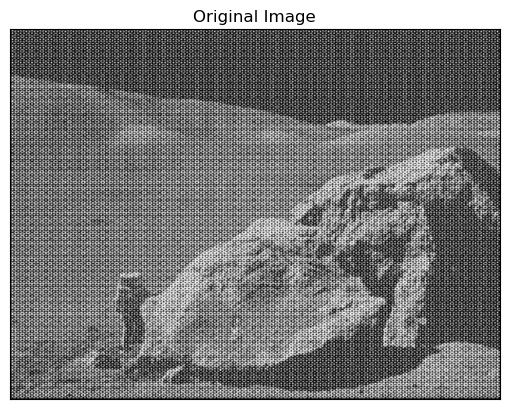

In [4]:
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.xticks([]), plt.yticks([])
plt.show()

In [5]:
# Преобразование Фурье
dft = cv.dft(np.float32(img), flags=cv.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

In [6]:
# Спектр величин
magnitude_spectrum = 20 * np.log(cv.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]) + 1)

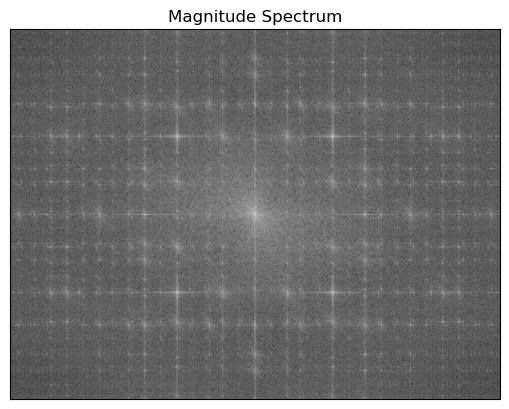

In [7]:
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')
plt.xticks([]), plt.yticks([])
plt.show()

In [8]:
# Создание высокочастотного фильтра Гаусса
rows, cols = img.shape
crow, ccol = rows // 2, cols // 2

In [9]:
# Функция для создания гауссовского высокочастотного фильтра
def gaussian_highpass_filter(shape, cutoff):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    
    # Создание сетки координат
    x = np.arange(cols)
    y = np.arange(rows)
    X, Y = np.meshgrid(x, y)
    
    # Расстояние от центра
    D = np.sqrt((X - ccol)**2 + (Y - crow)**2)
    
    # Гауссовский низкочастотный фильтр
    H_low = np.exp(-(D**2) / (2 * (cutoff**2)))
    
    # Высокочастотный = 1 - низкочастотный
    H_high = 1 - H_low
    
    return H_high

In [10]:
# Параметр cutoff (частота среза)
cutoff_frequency = 30

In [11]:
# Создание фильтра
gaussian_hp_filter = gaussian_highpass_filter(img.shape, cutoff_frequency)

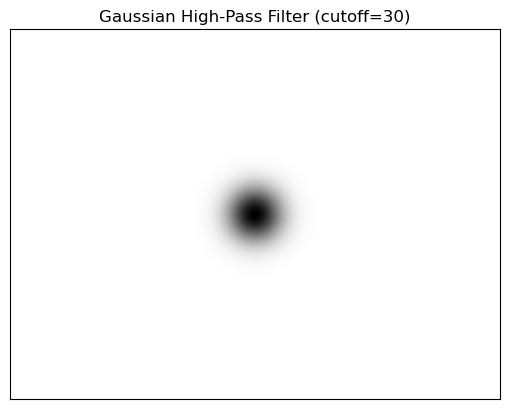

In [12]:
plt.imshow(gaussian_hp_filter, cmap='gray')
plt.title(f'Gaussian High-Pass Filter (cutoff={cutoff_frequency})')
plt.xticks([]), plt.yticks([])
plt.show()

In [13]:
# Применение фильтра в частотной области
# Расширение фильтра до 2 каналов
mask_high_pass = np.zeros_like(dft_shift)
mask_high_pass[:, :, 0] = gaussian_hp_filter
mask_high_pass[:, :, 1] = gaussian_hp_filter

In [14]:
# Умножение в частотной области
dft_shift_filtered = dft_shift * mask_high_pass

In [15]:
# Обратное преобразование
f_ishift = np.fft.ifftshift(dft_shift_filtered)
img_back_high_pass = cv.idft(f_ishift)
img_back_high_pass = cv.magnitude(img_back_high_pass[:, :, 0], img_back_high_pass[:, :, 1])

In [16]:
# Нормализация для отображения
img_back_high_pass_norm = cv.normalize(img_back_high_pass, None, 0, 255, cv.NORM_MINMAX)

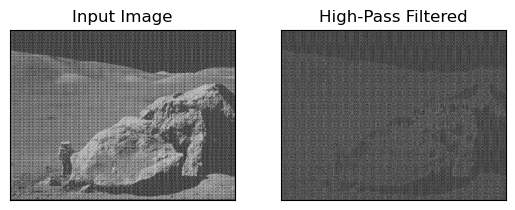

In [17]:
plt.subplot(121), plt.imshow(img, cmap='gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_back_high_pass_norm, cmap='gray')
plt.title('High-Pass Filtered'), plt.xticks([]), plt.yticks([])
plt.show()

In [18]:
# Сравнение разных частот среза
cutoff_values = [20, 30, 50, 70]

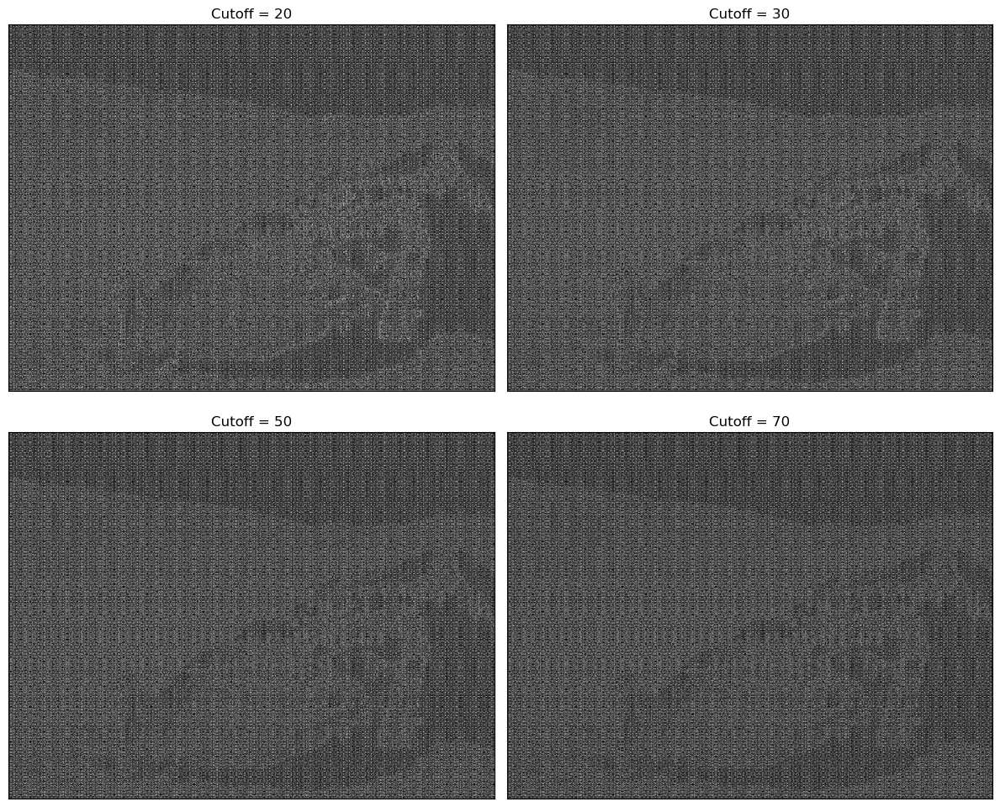

In [19]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for i, cutoff in enumerate(cutoff_values):
    # Создание фильтра
    hp_filter = gaussian_highpass_filter(img.shape, cutoff)
    
    # Применение
    mask = np.zeros_like(dft_shift)
    mask[:, :, 0] = hp_filter
    mask[:, :, 1] = hp_filter
    
    dft_filtered = dft_shift * mask
    f_ishift = np.fft.ifftshift(dft_filtered)
    img_back = cv.idft(f_ishift)
    img_back = cv.magnitude(img_back[:, :, 0], img_back[:, :, 1])
    img_back = cv.normalize(img_back, None, 0, 255, cv.NORM_MINMAX)
    
    axes[i].imshow(img_back, cmap='gray')
    axes[i].set_title(f'Cutoff = {cutoff}')
    axes[i].set_xticks([])
    axes[i].set_yticks([])

plt.tight_layout()
plt.show()

# 2. Реализуйте удаление периодического шума

In [20]:
# Спектр величин для обнаружения шума
magnitude_spectrum = 20 * np.log(cv.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]) + 1)

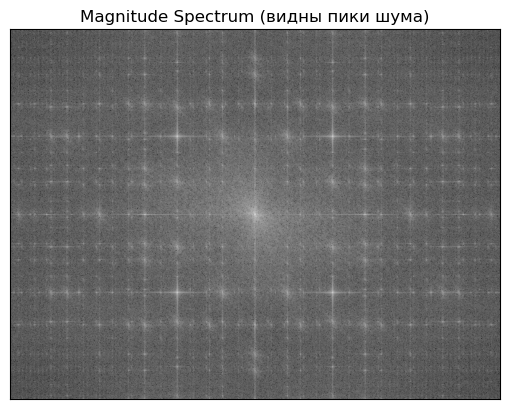

In [21]:
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum (видны пики шума)')
plt.xticks([]), plt.yticks([])
plt.show()

In [22]:
# Поиск пиков (периодический шум создает яркие точки в спектре)
rows, cols = img.shape
crow, ccol = rows // 2, cols // 2

In [23]:
min_distance = 30
threshold_abs = 300
noise_coords = peak_local_max(magnitude_spectrum, min_distance=min_distance, threshold_abs=threshold_abs)

In [24]:
print(f'Обнаружено пиков шума: {len(noise_coords)}')
print(f'Координаты пиков: {noise_coords[:10]}')  # Показываем первые 10

Обнаружено пиков шума: 9
Координаты пиков: [[297 393]
 [297 216]
 [297 570]
 [172 518]
 [422 268]
 [172 268]
 [422 518]
 [120 393]
 [474 393]]


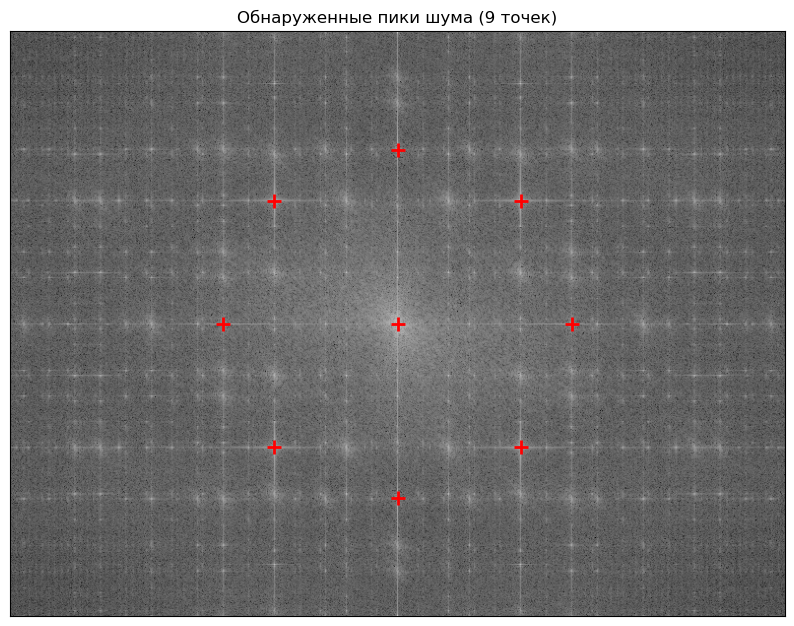

In [25]:
# Визуализация обнаруженных пиков
plt.figure(figsize=(10, 8))
plt.imshow(magnitude_spectrum, cmap='gray')
plt.plot(noise_coords[:, 1], noise_coords[:, 0], 'r+', markersize=10, markeredgewidth=2)
plt.title(f'Обнаруженные пики шума ({len(noise_coords)} точек)')
plt.xticks([]), plt.yticks([])
plt.show()

In [26]:
# Создание маски с режекторными (notch) фильтрами
# Используем кольцевой фильтр для подавления периодического шума
radius = 80
mask_noise = np.ones_like(dft_shift)

In [27]:
# Создание кольцевого режекторного фильтра
cv.circle(mask_noise, (ccol, crow), radius + 9, (0, 0, 0), -1)  # Внешний круг (черный)
cv.circle(mask_noise, (ccol, crow), radius - 9, (1, 1, 1), -1)  # Внутренний круг (белый)

array([[[1., 1.],
        [1., 1.],
        [1., 1.],
        ...,
        [1., 1.],
        [1., 1.],
        [1., 1.]],

       [[1., 1.],
        [1., 1.],
        [1., 1.],
        ...,
        [1., 1.],
        [1., 1.],
        [1., 1.]],

       [[1., 1.],
        [1., 1.],
        [1., 1.],
        ...,
        [1., 1.],
        [1., 1.],
        [1., 1.]],

       ...,

       [[1., 1.],
        [1., 1.],
        [1., 1.],
        ...,
        [1., 1.],
        [1., 1.],
        [1., 1.]],

       [[1., 1.],
        [1., 1.],
        [1., 1.],
        ...,
        [1., 1.],
        [1., 1.],
        [1., 1.]],

       [[1., 1.],
        [1., 1.],
        [1., 1.],
        ...,
        [1., 1.],
        [1., 1.],
        [1., 1.]]], shape=(594, 787, 2), dtype=float32)

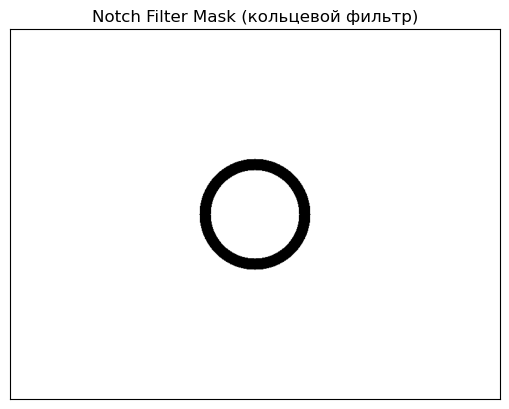

In [28]:
plt.imshow(mask_noise[:, :, 0], cmap='gray')
plt.title('Notch Filter Mask (кольцевой фильтр)')
plt.xticks([]), plt.yticks([])
plt.show()

In [29]:
# Применение фильтра
dft_shift_noise_removed = dft_shift * mask_noise

In [30]:
# Обратное преобразование
f_ishift_noise_removed = np.fft.ifftshift(dft_shift_noise_removed)
img_back_noise_removed = cv.idft(f_ishift_noise_removed)
img_back_noise_removed = cv.magnitude(img_back_noise_removed[:, :, 0], img_back_noise_removed[:, :, 1])

In [31]:
# Спектр после фильтрации
magnitude_spectrum_filtered = 20 * np.log(cv.magnitude(dft_shift_noise_removed[:, :, 0], dft_shift_noise_removed[:, :, 1]) + 1)

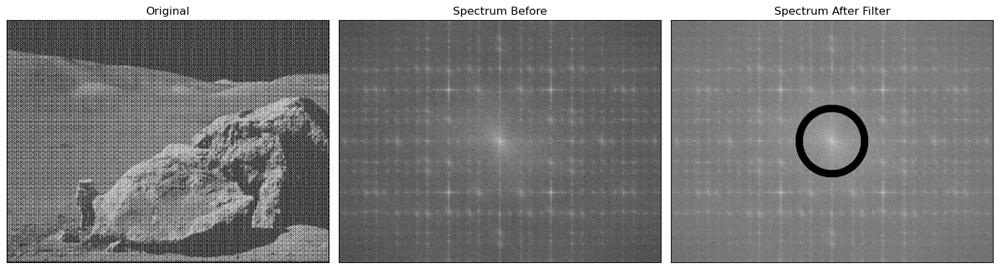

In [32]:
# Визуализация процесса удаления шума
plt.figure(figsize=(15, 5))

plt.subplot(131), plt.imshow(img, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])

plt.subplot(132), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Spectrum Before'), plt.xticks([]), plt.yticks([])

plt.subplot(133), plt.imshow(magnitude_spectrum_filtered, cmap='gray')
plt.title('Spectrum After Filter'), plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()

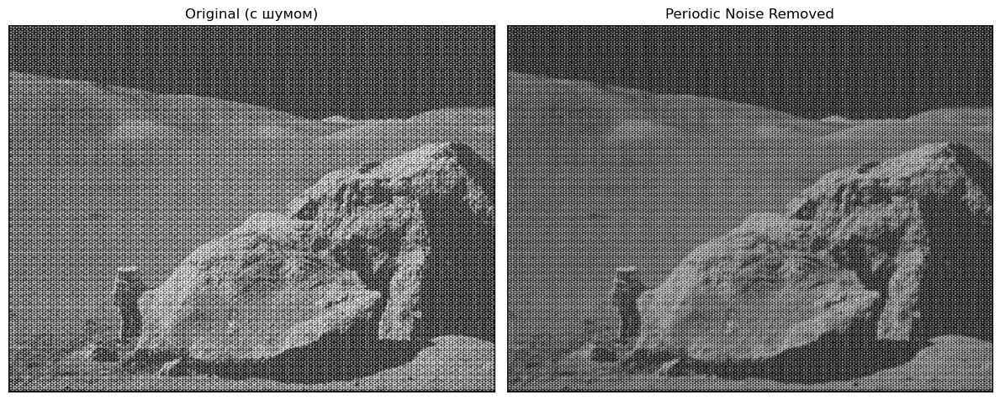

In [33]:
# Сравнение результатов
plt.figure(figsize=(12, 6))

plt.subplot(121), plt.imshow(img, cmap='gray')
plt.title('Original (с шумом)'), plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(img_back_noise_removed, cmap='gray')
plt.title('Periodic Noise Removed'), plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()

In [34]:
# Альтернативный метод: точечное подавление пиков
# Создание маски с подавлением конкретных пиков
mask_notch = np.ones_like(dft_shift)

In [35]:
# Подавление обнаруженных пиков небольшими кругами
notch_radius = 5
for coord in noise_coords:
    y, x = coord
    # Исключаем центральный пик (DC компонента)
    if abs(y - crow) > 20 or abs(x - ccol) > 20:
        cv.circle(mask_notch, (x, y), notch_radius, (0, 0, 0), -1)

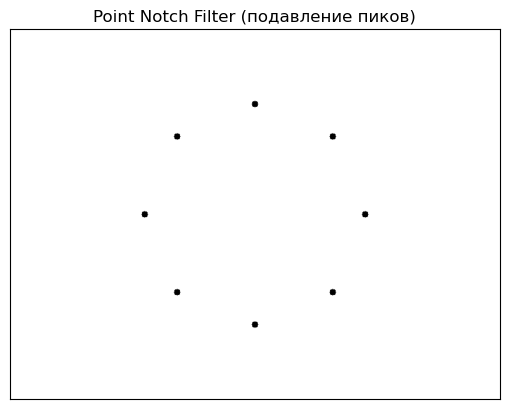

In [36]:
plt.imshow(mask_notch[:, :, 0], cmap='gray')
plt.title('Point Notch Filter (подавление пиков)')
plt.xticks([]), plt.yticks([])
plt.show()

In [37]:
# Применение точечного фильтра
dft_shift_notch = dft_shift * mask_notch
f_ishift_notch = np.fft.ifftshift(dft_shift_notch)
img_back_notch = cv.idft(f_ishift_notch)
img_back_notch = cv.magnitude(img_back_notch[:, :, 0], img_back_notch[:, :, 1])

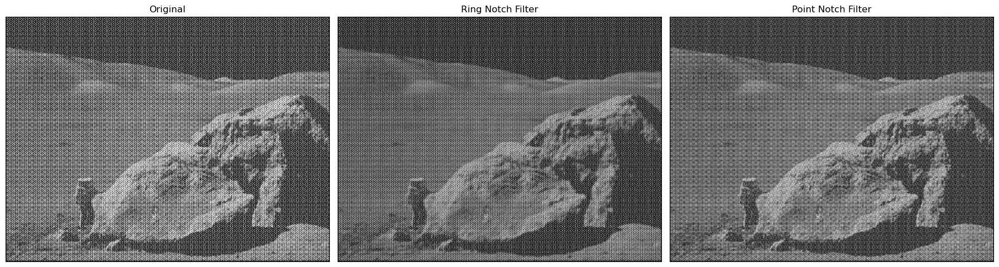

In [38]:
# Сравнение двух методов удаления шума
plt.figure(figsize=(18, 6))

plt.subplot(131), plt.imshow(img, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])

plt.subplot(132), plt.imshow(img_back_noise_removed, cmap='gray')
plt.title('Ring Notch Filter'), plt.xticks([]), plt.yticks([])

plt.subplot(133), plt.imshow(img_back_notch, cmap='gray')
plt.title('Point Notch Filter'), plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()

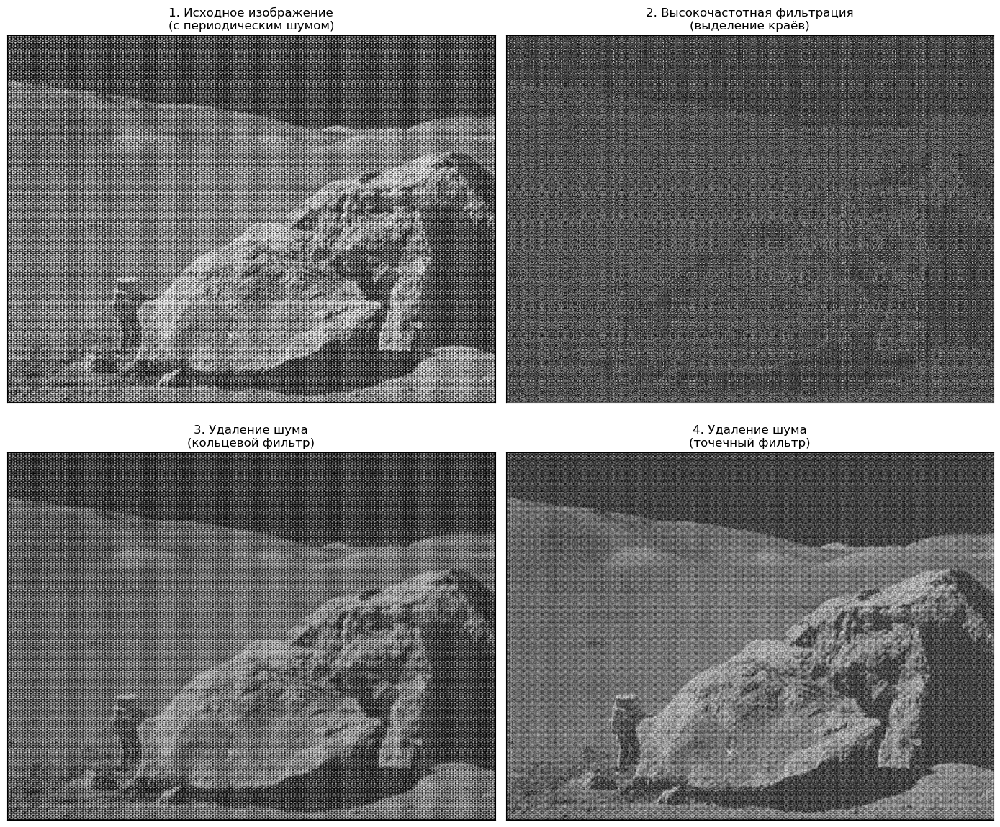

In [39]:
# Итоговое сравнение всех результатов
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

axes[0, 0].imshow(img, cmap='gray')
axes[0, 0].set_title('1. Исходное изображение\n(с периодическим шумом)', fontsize=12)
axes[0, 0].set_xticks([]), axes[0, 0].set_yticks([])

axes[0, 1].imshow(img_back_high_pass_norm, cmap='gray')
axes[0, 1].set_title('2. Высокочастотная фильтрация\n(выделение краёв)', fontsize=12)
axes[0, 1].set_xticks([]), axes[0, 1].set_yticks([])

axes[1, 0].imshow(img_back_noise_removed, cmap='gray')
axes[1, 0].set_title('3. Удаление шума\n(кольцевой фильтр)', fontsize=12)
axes[1, 0].set_xticks([]), axes[1, 0].set_yticks([])

axes[1, 1].imshow(img_back_notch, cmap='gray')
axes[1, 1].set_title('4. Удаление шума\n(точечный фильтр)', fontsize=12)
axes[1, 1].set_xticks([]), axes[1, 1].set_yticks([])

plt.tight_layout()
plt.show()

In [40]:
print('\n' + '='*60)
print('ВЫВОДЫ')
print('='*60)
print(f'''
1. ВЫСОКОЧАСТОТНАЯ ФИЛЬТРАЦИЯ:
   • Гауссовский ВЧ фильтр выделяет детали и края
   • Частота среза {cutoff_frequency} - оптимальная для данного изображения
   • Меньший cutoff = больше деталей, но больше шума

2. УДАЛЕНИЕ ПЕРИОДИЧЕСКОГО ШУМА:
   • Обнаружено {len(noise_coords)} пиков в спектре
   • Кольцевой фильтр - убирает шум на определенной частоте
   • Точечный фильтр - более точное подавление пиков
   • Оба метода эффективно удаляют периодические помехи

3. РЕКОМЕНДАЦИИ:
   • Для выделения краёв - высокочастотный фильтр
   • Для удаления регулярного шума - notch фильтры
   • FFT позволяет работать в частотной области эффективно
''')
print('='*60)


ВЫВОДЫ

1. ВЫСОКОЧАСТОТНАЯ ФИЛЬТРАЦИЯ:
   • Гауссовский ВЧ фильтр выделяет детали и края
   • Частота среза 30 - оптимальная для данного изображения
   • Меньший cutoff = больше деталей, но больше шума

2. УДАЛЕНИЕ ПЕРИОДИЧЕСКОГО ШУМА:
   • Обнаружено 9 пиков в спектре
   • Кольцевой фильтр - убирает шум на определенной частоте
   • Точечный фильтр - более точное подавление пиков
   • Оба метода эффективно удаляют периодические помехи

3. РЕКОМЕНДАЦИИ:
   • Для выделения краёв - высокочастотный фильтр
   • Для удаления регулярного шума - notch фильтры
   • FFT позволяет работать в частотной области эффективно

